# **PROBLEM STATEMENT:**
##The objectives of this small projct are as follows:
We have 60 images with 12 different types of pcbs. And we are supposed to do following things with it.

1.   To classify the testing PCB images into corresponding categories(12 categories).
2.   To identify whether the given image has PCB or Not in real time?








---

# **Objective 1**

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import cv2
from google.colab import drive
from google.colab.patches import cv2_imshow
drive.mount("/content/gdrive")

In [ ]:
!pip install opencv-contrib-python==4.4.0.44  #import this to  use the sirf (as patent has expired)

In [2]:
#PCB Image retrival from drive

pcb_images_dir = os.listdir('/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/grouped_datasets/pcb')
pcb_images = []
for each_image in pcb_images_dir:
  if each_image.endswith(".JPG"):
    full_path = "/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/grouped_datasets/pcb/" + each_image
    image = plt.imread(full_path)
    pcb_images.append(image)

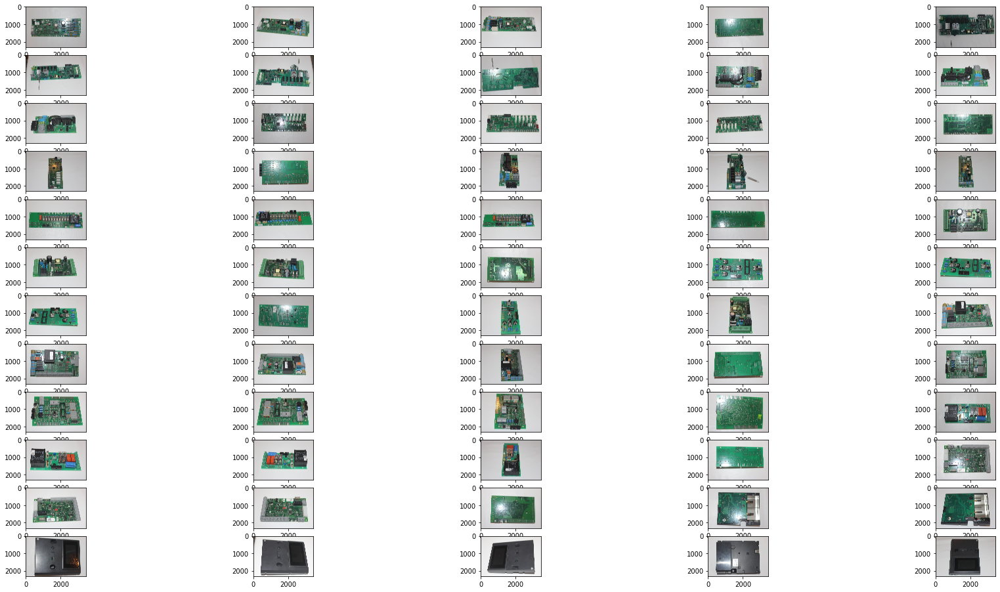

In [ ]:
#Visualization of all images of PCB:

plt.figure(figsize= (30,20))
for i, image in enumerate(pcb_images):
    plt.subplot(15, 5, i + 1)
    plt.imshow(image)

####**As images are too less for performing any kind of deep learning or even statistical learning even if we had a pretrained model we cant go for few shot setting as well. So I'm doing some feature matching and classical image processing in order to get some information out of PCB.**




PCB area extraction:

Gonna crop the picture based on the color saturation histogram.
The most commonly used  one is RGB model, which determines the coordinate position of each color in the color space through the projection value of each color in the red, green, and blue primary color spectrum components. Using the RGB model, its easy for us to  describe the color information of a color image, but this is not a way for the human eye to intuitively perceive the color of an object. The human eye often perceives the object from the three aspects of hue, saturation and brightness. colour. Hue describes the color attribute of a pure color, and saturation describes the degree to which a pure color is diluted by white light. The HSV color model in the computer uses this method to describe color pictures. Therefore, the HSV model is an ideal tool for developing image processing algorithms based on color description.\
The original image i got of the pcb was from camera in RGB format. Therefore, in the image processing stage, the conversion from the RGB model to the HSV model is required. The conversion is performed separately based on each pixel of the image. The conversion method is as follows:\
H component: $$
H=
\begin{cases}
\begin{aligned}
\theta, \quad &amp;B\le G\\
360-\theta, \quad&amp;B&gt;G
\end{aligned}
\end{cases},\quad
among them:
\theta=arccos\{ \frac {\frac 12 [(R-B)+(R-G)]}{[(R-G)^2+(R-B)(G-B)]^{1/2}} \}
$$S component: $$
S=1- \frac 3{R+G+B}[min(R, G, B)]
$$V component: $$
V=\frac 13(R+G+B)
$$

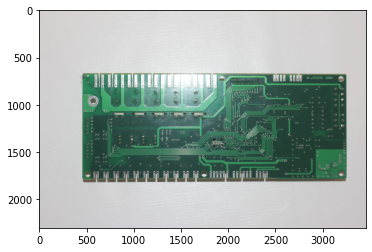

In [ ]:
#lets see a image
plt.imshow(pcb_images[14]) 

[None]


Text(0.5, 1.0, 'pcb_images[1]')

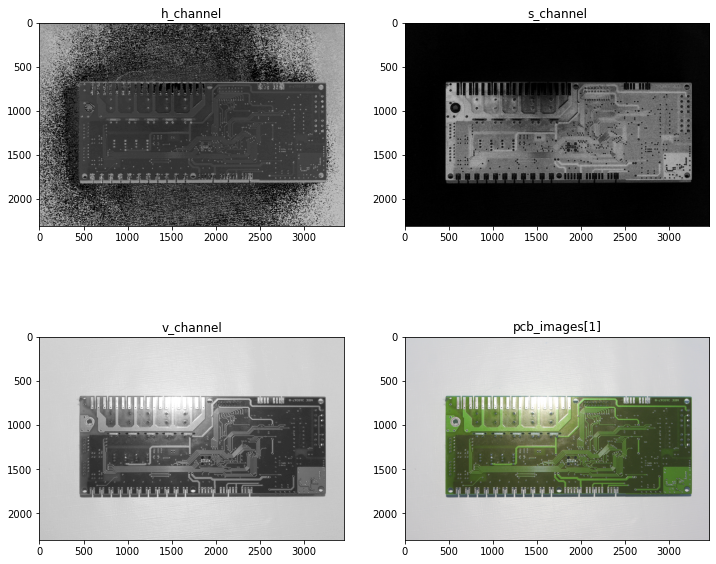

In [3]:
# Lets take 1 image for now 

image = pcb_images[14]

hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
fig, axes = plt.subplots(2, 2)
print(plt.setp(fig, size_inches=[12, 10]))
plt.subplots_adjust(top=0.9, bottom=0.1,wspace=0.2, hspace=0.2)
gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
axes[0][0].imshow(hsv_image[..., 0], cmap='gray')
axes[0][0].set_title("h_channel")
axes[0][1].imshow(hsv_image[..., 1], cmap='gray')
axes[0][1].set_title("s_channel")
axes[1][0].imshow(hsv_image[..., 2], cmap='gray')
axes[1][0].set_title("v_channel")
axes[1][1].imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
axes[1][1].set_title("pcb_images[1]")

In [4]:
s_image = hsv_image[..., 1]

Gaussian Filtering operator:
$$
Gaussian = \frac1{{2 \pi} \sigma^2} e ^{- \frac {(x- \bar {x}) ^ 2 + {(y- \bar {y}) ^ 2}} {2 \sigma ^ 2}}
$$

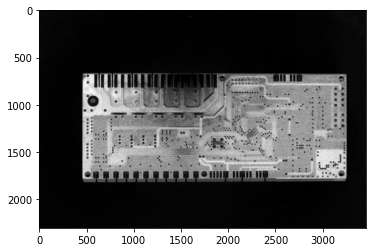

In [5]:
gauss_image = cv2.GaussianBlur(s_image, ksize=(7, 7), sigmaX=15, sigmaY=15)
plt.imshow(gauss_image, cmap='gray')

Bilateral filtering

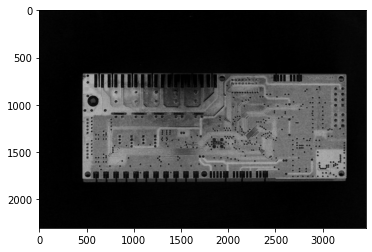

In [6]:
bilater_image = cv2.bilateralFilter(s_image, 10, 20, 30)
plt.imshow(bilater_image, cmap='gray')

60.0


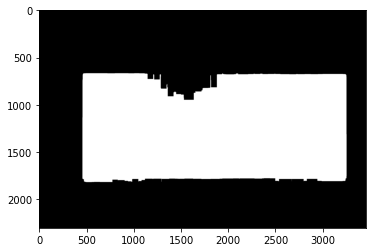

In [7]:
threshold, threshold_image = cv2.threshold(bilater_image, 0, 1, cv2.THRESH_OTSU)
width, height = threshold_image.shape[:2]
kernel = np.ones((int(height/40), int(width/40)))
threshold_image = cv2.morphologyEx(threshold_image, cv2.MORPH_CLOSE, kernel)
print(threshold)
plt.imshow(threshold_image, cmap='gray')

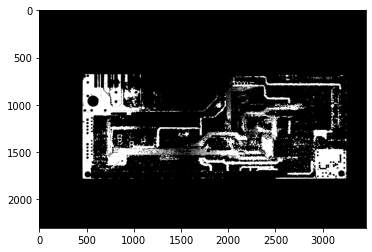

In [8]:
plt.imshow(cv2.threshold(bilater_image, 125, 255, cv2.THRESH_BINARY)[1], cmap="gray")

angle:  -90.0


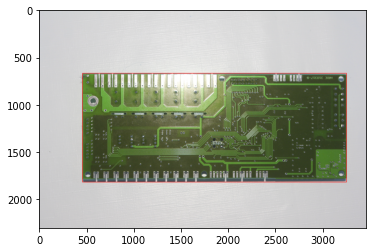

In [9]:
height, width = threshold_image.shape[:2]
contours, hierarchy = cv2.findContours(threshold_image, cv2.RETR_TREE,
		cv2.CHAIN_APPROX_SIMPLE)
contour_img = np.zeros((height, width, 3), np.uint8)
contours_poly = []
for index, contour in enumerate(contours):
    if cv2.contourArea(contour) > height * width / 4:
        # For contours that meet the conditions, we gotta get the coordinates of the approximate polygon.
        contours_poly.append(cv2.approxPolyDP(contour, epsilon=5, closed=True))
        rect = cv2.minAreaRect(contour)       # For Finding the smallest bounding rectangle
        cv2.drawContours(contour_img, contours, index, (255, 255, 255), 2)
        contours_poly0 = contours_poly[0]
center_x, center_y = rect[0]
rect_w, rect_h = rect[1]
angle = rect[2]
points = cv2.boxPoints(rect)
image_rect = image.copy()
for i in range(len(points)):
    cv2.line(image_rect, tuple(points[i]), tuple(points[(i+1)%4]), (0, 0, 255), 3)
plt.imshow(cv2.cvtColor(image_rect, cv2.COLOR_BGR2RGB))
print("angle: ", angle)

Rotating and adjusting the original image through the center point of the rectangle we got  and the angle information to make it a bit more horizontal.

rotate matrix:  [[ 1.  0.  0.]
 [-0.  1.  0.]]


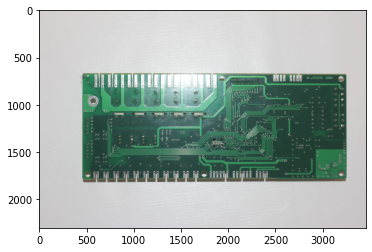

In [10]:
if abs(angle) >= 45:
    rotate_angle = 90 + angle
else:
    rotate_angle = angle
rotate_matrix = cv2.getRotationMatrix2D(rect[0], rotate_angle, scale=1)
print("rotate matrix: ", rotate_matrix)

rotate_image = cv2.warpAffine(image, rotate_matrix, image.shape[1::-1])
plt.imshow(rotate_image)

In [11]:
#lets see the points we got above by thresholding
print("Points: ", points)
print(np.ones((4, 1)))
points = np.transpose(np.concatenate([points, np.ones((4, 1))], axis = -1))
print("New Points: ", points)

Points:  [[3250. 1818.]
 [ 459. 1818.]
 [ 459.  668.]
 [3250.  668.]]
[[1.]
 [1.]
 [1.]
 [1.]]
New Points:  [[3.250e+03 4.590e+02 4.590e+02 3.250e+03]
 [1.818e+03 1.818e+03 6.680e+02 6.680e+02]
 [1.000e+00 1.000e+00 1.000e+00 1.000e+00]]


In [12]:
points = np.transpose(np.int0(np.matmul(rotate_matrix, points)))
print("New points: ", points)

New points:  [[3250 1818]
 [ 459 1818]
 [ 459  668]
 [3250  668]]


x_min: 459, y_min: 668
x_max: 3250, y_max: 1818
Cropped and horizontally modified image


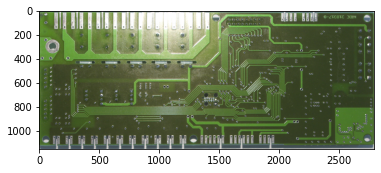

In [13]:
x_min = np.min(points, axis=0)[0]
y_min = np.min(points, axis=0)[1]
print("x_min: {0}, y_min: {1}".format(x_min, y_min))
x_max, y_max = np.max(points, axis=0)
print("x_max: {0}, y_max: {1}".format(x_max, y_max))
print("Cropped and horizontally modified image")
pcb_image = rotate_image[y_min: y_max, x_min: x_max, :]
plt.imshow(cv2.cvtColor(pcb_image, cv2.COLOR_BGR2RGB))
# cv2.imwrite("/content/gdrive/MyDrive/Colab Notebooks/pca_dataset/task1/grouped_datasets/pcb/modified/pcb3.jpg", pcb_image) #for saving image

## **Now lets go for Harris corner detection**

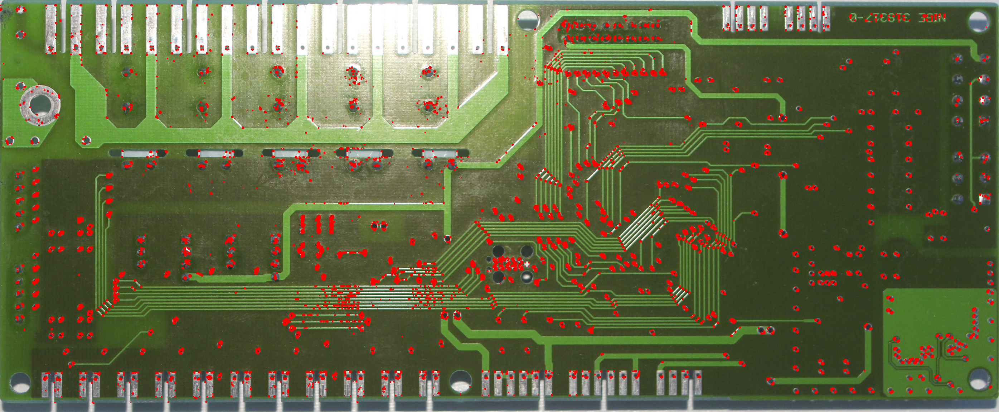

In [ ]:
# From opencv module docs : https://docs.opencv.org/3.4/dc/d0d/tutorial_py_features_harris.html
img = np.array(pcb_image) 
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray,4,3,0.04)

#result is dilated for marking the corners, not important
dst = cv2.dilate(dst,None)

# Threshold for an optimal value, it may vary depending on the image.
img[dst>0.01*dst.max()]=[0,0,255]
cv2_imshow(img)
if cv2.waitKey(0) & 0xff == 27:
    cv2.destroyAllWindows()

# plt.imshow(pcb_image)

## **Image processing stuff**



In [ ]:
#Lets take 2 images of same pcb class and operate on them.
img1 = cv2.imread("/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/grouped_datasets/pcb/IMG_9290.JPG")
img2 = cv2.imread("/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/grouped_datasets/pcb/IMG_9291.JPG")

uint8
2304
3456
3


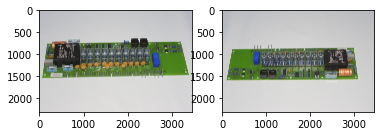

In [ ]:
# Check the image matrix data type (could know the bit depth of the image)
print(img1.dtype)
# Check the height of image 
print(img1.shape[0])
# Check the width of image 
print(img1.shape[1])
# Check the number of channels of the image
print(img1.shape[2])

f, axarr = plt.subplots(1,2)
axarr[0].imshow(img1)
axarr[1].imshow(img2)

**Generating Histogram:**

To enhance the contrast in our image or expand the contrast in a particular region while sacrificing the detail in colors that don’t vary much, or don’t matter. 

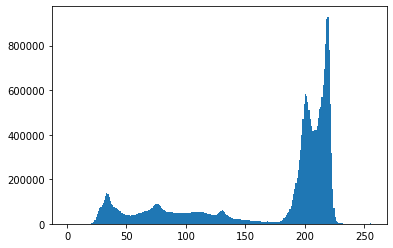

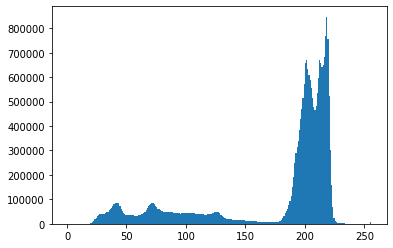

In [ ]:
plt.hist(img1.ravel(),bins = 256, range = [0,256]) 
plt.show()

plt.hist(img2.ravel(),bins = 256, range = [0,256]) 
plt.show()

Displaying the histogram of R, G, B channel
We could observe that the green channel has many pixels in 255, which represents the white patch in the image(as pcb has max color occupeid with green.)

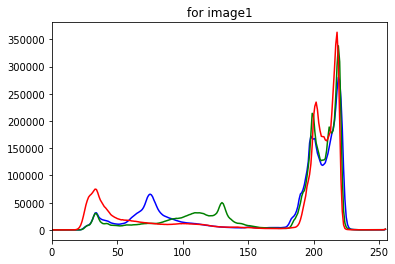

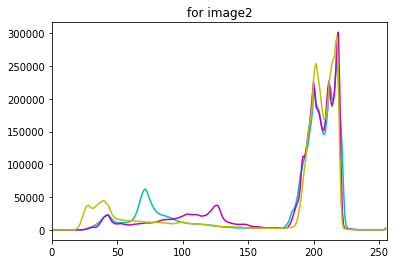

In [ ]:
color = ('b','g','r')
for i,col in enumerate(color):
    histr = cv2.calcHist([img1],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.title("for image1")
plt.show()

color = ('c','m','y')
for i,col in enumerate(color):
    histr = cv2.calcHist([img2],[i],None,[256],[0,256])
    plt.plot(histr,color = col)
    plt.xlim([0,256])
    plt.title("for image2")
plt.show()

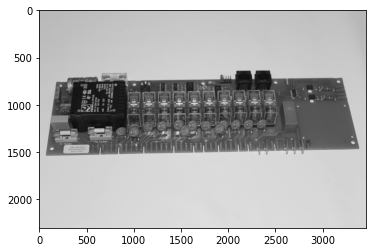

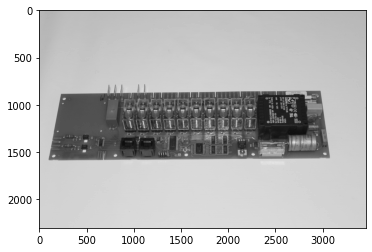

In [ ]:
gray_image1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray_image1 = np.float32(gray_image1)
plt.imshow(gray_image1,cmap='gray')
plt.show()

gray_image2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
gray_image2 = np.float32(gray_image2)
plt.imshow(gray_image2,cmap='gray')
plt.show()

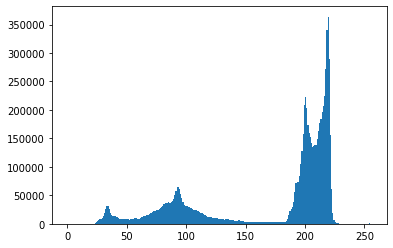

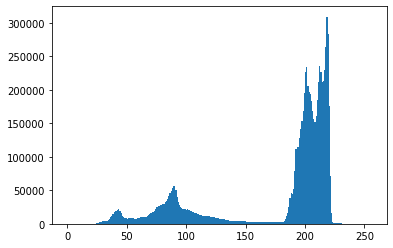

In [ ]:
# Plotting the histogram of the gray images. We could observe that the frequency of the image hist has decreased ~ 1/5 of the histogram of color image.
plt.hist(gray_image1.ravel(),bins = 256, range = [0, 256])
plt.show()
plt.hist(gray_image2.ravel(),bins = 256, range = [0, 256])
plt.show()

Contours to see the gradient spikes.

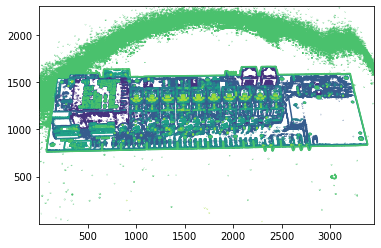

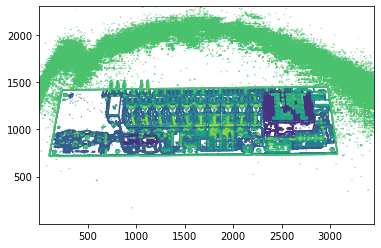

In [ ]:
plt.contour(gray_image1, origin = "image")
plt.show()
plt.contour(gray_image2, origin = "image")
plt.show()

**Histogram Equalization:**

Histogram equalization on the images. This transform flattens the gray-level histogram so that all intensities are as equally common as possible. The transform function is a cumulative distribution function (cdf) of the pixel values in the image (normalized to map the range of pixel values to the desired range). This example uses grayscaled image  of 1st image (gray_image1) of  2nd one (gray_image2).

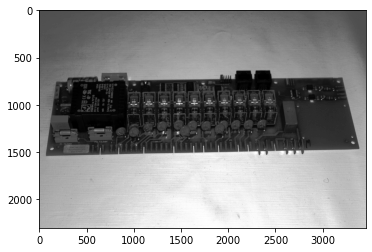

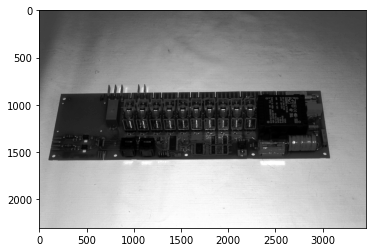

In [ ]:
# function of histogram equalization
def histeq(im, nbr_bins = 256):
  """ Histogram equalization of a grayscale image.  """
  # get the image histogram
  imhist, bins = np.histogram(im.flatten(), nbr_bins, [0, 256])
  cdf = imhist.cumsum() # cumulative distribution function
  cdf = imhist.max()*cdf/cdf.max()  #normalize
  cdf_mask = np.ma.masked_equal(cdf, 0)
  cdf_mask = (cdf_mask - cdf_mask.min())*255/(cdf_mask.max()-cdf_mask.min())
  cdf = np.ma.filled(cdf_mask,0).astype('uint8')
  return cdf[im.astype('uint8')]

# applying the function on our dark image to increase the contrast
# we could observe that the contrast of the black background has increased.
# for 1st image:
histeq_image1 = histeq(gray_image1)
plt.imshow(histeq_image1,cmap='gray')
plt.show()
# for 2nd image:
histeq_image2 = histeq(gray_image2)
plt.imshow(histeq_image2,cmap='gray')
plt.show()

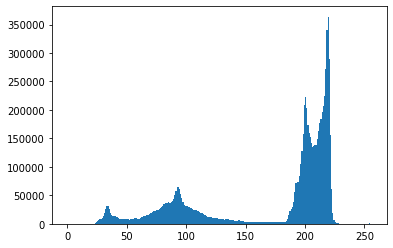

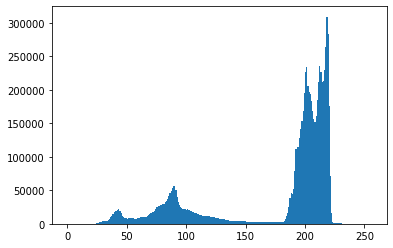

In [ ]:
# Before histogram equalization
plt.hist(gray_image1.ravel(),bins = 256, range = [0, 256])
plt.show()

plt.hist(gray_image2.ravel(),bins = 256, range = [0, 256])
plt.show()

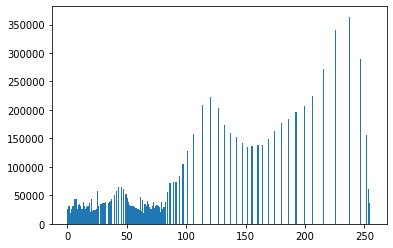

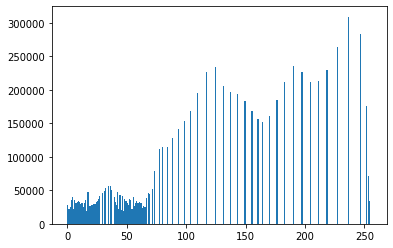

In [ ]:
# After histogram equalization
plt.hist(histeq_image1.ravel(),bins = 256, range = [0, 256])
plt.show()

plt.hist(histeq_image2.ravel(),bins = 256, range = [0, 256])
plt.show()

**Fourier Transform of Gray Images:**

Fourier transform is used to find the frequency domian of an image. We can consider an image as a signal which is sampled in two directions. So taking a fourier transform in both X and Y directions gives us the frequency representation of image. For the sinusoidal signal, if the amplitude varies so fast in short time, we can say it is a high frequency signal. If it varies slowly, it is a low frequency signal. Edges and noises are high frequency contents in an image because they change drastically in images.

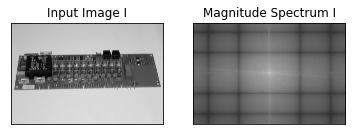

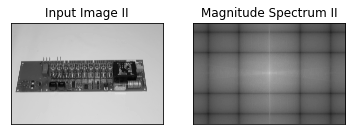

In [ ]:
#For image 1:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur1 = cv2.blur(gray_image1,(5,5))
# Transform the image to frequency domain
f1 = np.fft.fft2(imBlur1)
# Bring the zero-frequency component to the center
fshift1 = np.fft.fftshift(f1)
magnitude_spectrum1 = 30*np.log(np.abs(fshift1))

plt.subplot(121),plt.imshow(imBlur1, cmap = 'gray')
plt.title('Input Image I'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum1, cmap = 'gray')
plt.title('Magnitude Spectrum I'), plt.xticks([]), plt.yticks([])
plt.show()


#for image 2:
# Blur the grayscale image by a Guassian filter with kernel size of 10
imBlur2 = cv2.blur(gray_image2,(5,5))
# Transform the image to frequency domain
f2 = np.fft.fft2(imBlur2)
# Bring the zero-frequency component to the center
fshift2 = np.fft.fftshift(f2)
magnitude_spectrum2 = 30*np.log(np.abs(fshift2))

plt.subplot(121),plt.imshow(imBlur2, cmap = 'gray')
plt.title('Input Image II'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(magnitude_spectrum2, cmap = 'gray')
plt.title('Magnitude Spectrum II'), plt.xticks([]), plt.yticks([])
plt.show()

 **Finding Edges by Highpass Filtering in FFT:**

Here we are conducting a high pass filter to remove the low frequency component, resulting in a sharpened image which contains the edges


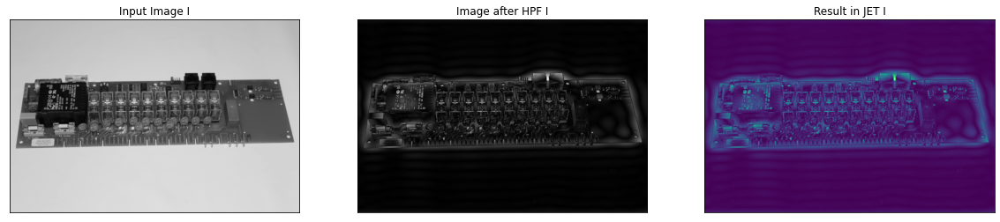

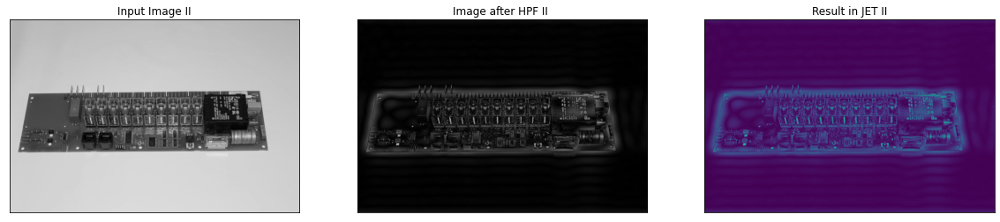

In [ ]:
#for Image 1:
rows1, cols1 = imBlur1.shape
crow1,ccol1 = round(rows1/2) , round(cols1/2)
# remove low frequencies with a rectangle size of 10
fshift1[crow1-10:crow1+10, ccol1-10:ccol1+10] = 0
f_ishift1 = np.fft.ifftshift(fshift1)
img_back1 = np.fft.ifft2(f_ishift1)
img_back1 = np.abs(img_back1)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur1, cmap = 'gray')
plt.title('Input Image I'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back1, cmap = 'gray')
plt.title('Image after HPF I'), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back1)
plt.title('Result in JET I'), plt.xticks([]), plt.yticks([])
plt.show()


#for Image 2:
rows2, cols2 = imBlur2.shape
crow2,ccol2 = round(rows2/2) , round(cols2/2)
# remove low frequencies with a rectangle size of 10
fshift2[crow2-10:crow2+10, ccol2-10:ccol2+10] = 0
f_ishift2 = np.fft.ifftshift(fshift2)
img_back2 = np.fft.ifft2(f_ishift2)
img_back2 = np.abs(img_back2)

plt.figure(figsize=([20, 20]))
plt.subplot(131),plt.imshow(imBlur2, cmap = 'gray')
plt.title('Input Image II'), plt.xticks([]), plt.yticks([])
plt.subplot(132),plt.imshow(img_back2, cmap = 'gray')
plt.title('Image after HPF II '), plt.xticks([]), plt.yticks([])
plt.subplot(133),plt.imshow(img_back2)
plt.title('Result in JET II'), plt.xticks([]), plt.yticks([])
plt.show()

So ,as we have to make them robust to be invariate to angle and resolution shifts so i came to conclusion of using Scale-invariant feature transform. 

Example Image:
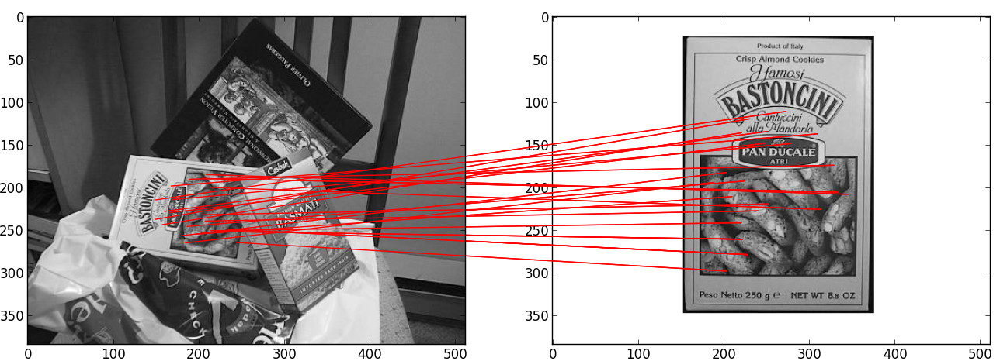 
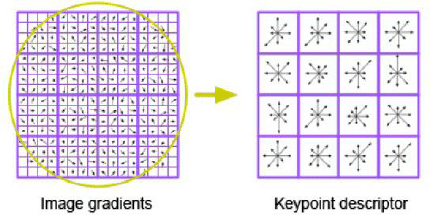

## **SIFT**

The SIFT algorithm suggests that for spot detection on a certain scale, a DoG (Difference of Gaussian) response value image can be obtained by subtracting two adjacent Gaussian scale space images $D(x, y,\sigma) )$. Then imitating the Laplacian of Gaussian(spacial Filter) method, by performing non-maximum suppression (local maximum search) on the response value image $D(x, y, \sigma)$, the spots are located in the location space and the scale space. Where: 
$$
D(x, y, \sigma)=(G(x, y, k\sigma)-G(x, y, \sigma))\otimes I(x, y)
$$

and
$$
g (x, y, \sigma) = \frac 1 {2 \pi \sigma^2} e ^ {- \frac{x ^2 + y^2} {2 \sigma^2}}
$$

In [ ]:
import sympy
x, y, sigma, g = sympy.symbols("x, y, sigma, g")
kernel_w, kernel_h = [10, 10]
gauss = 1/(sympy.sqrt(2*sympy.pi)*sigma)*sympy.exp(-(x-kernel_w/2)**2/(2 * sigma**2))
print("gauss function:\n")
gauss

gauss function:



sqrt(2)*exp(-12.5*(0.2*x - 1)**2/sigma**2)/(2*sqrt(pi)*sigma)

In [ ]:
laplacian = sigma * gauss.diff(x, 2)
print("laplacian function:\n" )
laplacian

laplacian function:



-sqrt(2)*(1.0 - 25.0*(0.2*x - 1)**2/sigma**2)*exp(-12.5*(0.2*x - 1)**2/sigma**2)/(2*sqrt(pi)*sigma**2)

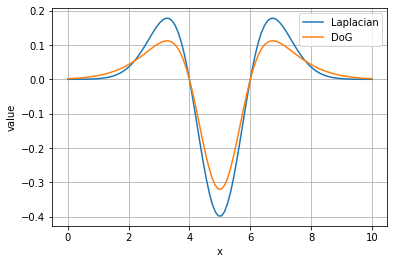

In [ ]:
laplacian = sigma * gauss.diff(x, 2)
lap_func = sympy.lambdify([sigma, x], laplacian, "numpy")
gauss_func = sympy.lambdify([sigma, x], gauss, "numpy")
value1 = lap_func(1, np.linspace(0, 10, 100))
value2 = gauss_func(1.6, np.linspace(0, 10, 100)) - gauss_func(0.7, np.linspace(0, 10, 100))
plt.plot(np.linspace(0, 10, 100), value1, label=r"Laplacian")
plt.plot(np.linspace(0, 10, 100), value2, label=r"DoG")
plt.grid('on')
# plt.text(7.5, 0.15, r"Laplacian")
plt.xlabel(r"x")
plt.ylabel(r"value")
plt.legend()
plt.show()

### **Sirf on image, lets see some keypoints**

In [17]:
img = np.array(pcb_image)
# Initiate sift detector
sift = cv2.SIFT_create ()
# find the keypoints with ORB
kp1, des1 = sift.detectAndCompute(img,None)
# draw only keypoints location,not size and orientation
img = cv2.drawKeypoints(img, kp1, None,color=(255,0,0))
cv2.imwrite('sift_keypoints.jpg',img)

True

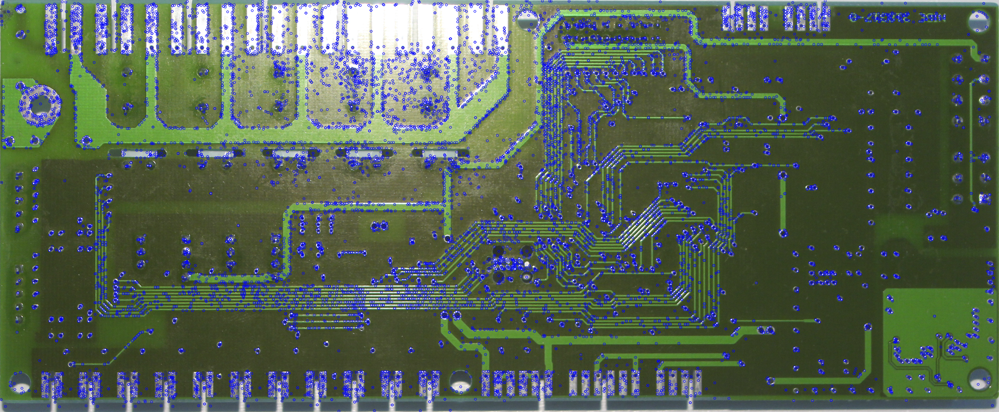

In [ ]:
cv2_imshow(img)

### **Now Lets try this method on our dataset of 60 pcbs:**

Their info are as follows:
1. F310 - 5 images
2. EVC13 - 5 images
3. FVP relay - 5 images
4. MCB - 5 images
5. HMI - 7 images
6. ASB - 5 images
7. ACB - 5 images
8. Power 3x400 - 5 images
9. PCA Input - 4 images
10. PCA Accessory - 5 images
11. PCA Base - 5 images
12. STYR2002 relay -  4 images


So for the matcher we generally use L2-norm, Since SIFT/SURF descriptors represent the histogram of oriented gradient of the Haar wavelet response in a neighborhood, alternatives of the Euclidean distance are histogram-based metrics like: χ2, Earth Mover’s Distance. And for binary kind-off problem we generally use Hamming distance(hamming(a,b)=∑i=0n−1(ai⊕bi)).


And we will use distance ratio kind-off stuff: The distance ratio between the two nearest matches of a considered keypoint is computed and it is a good match when this value is below a threshold. Indeed, this ratio allows helping to discriminate between ambiguous matches (distance ratio between the two nearest neighbors is close to one) and well discriminated matches. Therefore, we use flnn.

I am using **1 image/classfor Query_Image and for testing ill use 3 other. I am ignoring the bottom part of every pcb as i dont have testing data for that** and there for no use to pass it as query as i wont have any test image, but same approach can be used for bottom part matching as.



In [15]:
'''
DATA NOW:-
12 classes:
1. F310 - 4 images
2. EVC13 - 4 images
3. FVP relay - 4 images
4. MCB - 4 images
5. HMI - 7 images
6. ASB - 4 images
7. ACB - 4 images
8. Power 3x400 - 4 images
9. PCA Input - 3 images
10. PCA Accessory - 4 images
11. PCA Base - 4 images
12. STYR2002 relay -  3 images

Here we are creating 2 Dictionaries:
1. query_dict with keys as PCB name and values as image itself. (12 keys and each value , therefore 12 values)
2. test_dict with keys as  PCB name and value as images of hat. (12 keys but muliple values)

Then we have Qpara_Dict, for storing the keys as Pcb name and values as kp and des from the orb.
Then we take these 2 values and use them in  a knn based matcher named flnn that works on distance ratio.

'''


#Feature Matching 
index_params = dict(algorithm = 0,trees = 5)
search_params = dict()
flann = cv2.FlannBasedMatcher(index_params, search_params)

query_dict = {}
test_dict = {}

PCB_Folders = os.listdir("/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered")
for folder in PCB_Folders:  
  folderPath = os.path.join("/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/" , folder)
  folderImages = os.listdir(folderPath)
  print(folderPath)
  imagePath = os.path.join(folderPath, folderImages[0])
  query_dict[folder] = cv2.imread(imagePath,cv2.IMREAD_GRAYSCALE)
  testImages = []
  for image in folderImages[1:]:
    imagePath_test = os.path.join(folderPath, image)
    testImages.append(cv2.imread(imagePath_test,cv2.IMREAD_GRAYSCALE))
  test_dict[folder] = testImages


#finding the kp and des of every quary image and then storing it in Qpara_Dict with keys as class and value as tuple of kp and des.
query_dict_keys = list(query_dict.keys())
Qpara_Dict = {}
for images in query_dict:
  kp,des = sift.detectAndCompute(query_dict[images],None) #(kp_image, des_image) 
  des = np.float32(des)  #because the flnn uses that but not bruteforce.
  Qpara_Dict [images] = [kp,des] #Qpara_Dict(keys= classes, values=(kp,des))

/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/F310
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/EVC13
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/FVP relay
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/MCB
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/HMI
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/ASB
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/ACB
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/Power 3x400
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/STYR2002 relay
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/filtered/PCA Base
/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task1/saperated_dataset/f

In [24]:
#testing for all images from the dataset we have:

True_Results = []
False_Results = []
for Pcb_classes in test_dict:
  for grayframe in test_dict[Pcb_classes]:
    kp_grayframe, des_grayframe = sift.detectAndCompute(grayframe,None)
    des_grayframe = np.float32(des_grayframe)  
    matches_comparer = []
    for key in query_dict_keys:
      des_queryImage = (Qpara_Dict[key][1])
      matches = (flann.knnMatch((Qpara_Dict[key][1]), des_grayframe, k = 2))
      good_points = []
      for m,n  in matches:  # m: Query_Image,  n: Train_Image
        if m.distance < (0.6)*n.distance: #0.6 here is hyper-parameter.
          good_points.append(m)
      matches_comparer.append(len(good_points))
    Testing_image_result = query_dict_keys[(matches_comparer.index(max(matches_comparer)))]
    if Testing_image_result == Pcb_classes:
      True_Results.append("PBC_MATCHED")
    else:
      False_Results.append("PBC_NOT_MATCHED")  

## **Accuracy**
For task lets see how much accuracy do we get by above method and testing

In [25]:
False_Results, True_Results

(['PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED',
  'PBC_NOT_MATCHED'],
 ['PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED',
  'PBC_MATCHED'])

In [26]:
accuracy = len(True_Results)/(len(False_Results) + len(True_Results))
print("accuracy on test data:", accuracy)

accuracy on test data: 0.6756756756756757


**Accuracy is 67.567~ 68% on taking 12 images as train and 37 images as testing.**



NOTE: I don't have physical pcbs of this kind, so cant test in real-time, but the process will be same as above, what we are going to do is just take the frames as Test_Images but we dont need the above methods to crop, rotate and grayscaling, because our method is robust and it can work on transtion invatiate images  and that will save resource and processing time.


 **For Real Time Setting:**

In [ ]:
# # specially for non colab-settings, when running in local host.

# img = cv2.imread("/content/gdrive/MyDrive/Colab Notebooks/pca_dataset/task1/grouped_datasets/pcb/IMG_9290.JPG",cv2.IMREAD_GRAYSCALE)  #Query_Image

# capturing =  cv2.VideoCapture(0)


# # Features :
# orb = cv2.ORB_create(nfeatures=1500)
# kp_image, des_image = orb.detectAndCompute(img,None)
# # img = cv2.drawKeypoints(img, kp_image, img)


# #Feature Matching :
# index_params = dict(algorithm = 0,trees = 5)
# search_params = dict()
# flann = cv2.FlannBasedMatcher(index_params, search_params)


# while True:
#   _, frame = capturing.read()
#   grayframe = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)  #Train_Image   (showing error as empty in colab because of no videocapture avvailable by this method on colab)
#   kp_grayframe, des_grayframe = orb.detectAndCompute(grayframe,None)
#   # grayframe = cv2.drawKeypoints(grayframe, kp_grayframe, grayframe) #to show on image

#   matches = flann.knnMatch(des_image, des_grayframe, k = 2)

#   good_points = []
#   for m,n  in matches:  # m: Query_Image,  n: Train_Image 
#     if m.distance < (0.6)*n.distance: #0.6 here is hyper-parameter.
#       good_points.append(m)

#   # img_match = cv2.drawMatches(img, kp_image, grayframe, kp_grayframe, good_points, grayframe)


#   # HOMOGRAPHY
#   if len(good_points) > 10:
#     query_pts = np.float32([kp_image[m.queryIdx].pt for m in good_points]).reshape(-1,1,2)  #exctracting the positions of points of Query_Image 
#     train_pts = np.float32([kp_grayframe[m.trainIdx].pt for m in good_points]).reshape(-1,1,2)

#     matrix, mask = cv2.findHomography(query_pts,train_pts,cv2.RANSAC,5.0)
#     matches_mask = mask.ravel().tolist()

#     #Perspective Transform 
#     height, width = img.shape()
#     pts = np.float32([[0,0], [0,h], [w,h], [w,0]]).reshape(-1,1,2)
#     dst = cv2.perspectiveTransform(pts, matrix)

#     homography = cv2.polylines(frame, [np.int32(dst)], True, (255,0,0),3)

#     cv2_imshow(homography)
#   else:  
#     cv2_imshow(grayframe)

#   # cv2_imshow(img)
#   # cv2_imshow(grayframe)
#   # cv2_imshow(img_match)


#   key = cv2.waitkey(1)
#   if key == 27:
#     break

In [ ]:
##For colab use for taking real time frames.

# from IPython.display import Image
# try:
#   filename = take_photo()
#   print('Saved to {}'.format(filename))
#   # Show the image which was just taken.
#   display(Image(filename))
# except Exception as err:
#   # Errors will be thrown if the user does not have a webcam or if they do not
#   # grant the page permission to access it.
#   print(str(err))

# **-------------------------------  END OF OBJECTIVE 1  ---------------------------------------**



---

# **Objective 2**

So as we have scarcity of dataset, in that case above aproach can also be applied with little bit of adjustment.But for saving time and computational resource, i would like to go for the small cnn network and i could'nt find any better pre-trained network so I would go with the simple small cnn. I have got some random images of same resolution from internet that ill use it to balance the data. and I have used the simmilar looking images of weather for that.I have 60 images of PCBs and 60 random images from internet with same resolution and then i used the default keras data augmentation api to make most out of the data we have by transforming it and using it for training on more dataset.

In [ ]:
from keras.models import Sequential
from keras.layers import Convolution2D
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from keras.layers import Dense
from keras.layers import Dropout

### **DATASET(before augmentation):**
Train - pcb(42) , non_pcb(42) \
Test - pcb(18) , non_pcb(18)

### **Defining the Model**

In [ ]:
classifier = Sequential()

# Step 1 - Convolution
classifier.add(Convolution2D(64, 3, 3, input_shape = (256, 256, 3), activation = 'relu'))
# Step 2 - Pooling and dropout
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.25))
# Adding a second convolutional layer
classifier.add(Convolution2D(64, 3, 3, activation = 'relu'))
classifier.add(MaxPooling2D(pool_size = (2, 2)))
classifier.add(Dropout(0.5))
# Step 3 - Flattening
classifier.add(Flatten())
classifier.add(Dropout(0.5))
# Step 4 - Full connection
classifier.add(Dense(units= 256, activation = 'relu'))
classifier.add(Dropout(0.5))
classifier.add(Dense(units= 1, activation = 'sigmoid'))

# Compiling the CNN
classifier.compile(optimizer = 'adam', loss = 'binary_crossentropy', metrics = ['accuracy'])

### **Data Augmentation**

In [ ]:
#data augmentation part as we have a less amount of data:

from keras.preprocessing.image import ImageDataGenerator
train_datagen = ImageDataGenerator(rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                                   width_shift_range=0.2,
                                   height_shift_range=0.2,
                                   rotation_range=15,
                                   vertical_flip=True,
                                   fill_mode='reflect',
                                   data_format='channels_last',
                                   brightness_range=[0.5, 1.5],
                                   featurewise_center=True,
                                   featurewise_std_normalization=True)

test_datagen = ImageDataGenerator(rescale = 1./255)

#training dataset:  Have stored on my drive in train folder have PCB and some random images from internet in same resolution.
training_set = train_datagen.flow_from_directory('/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task2/train',
                                                 target_size = (256, 256),
                                                 batch_size = 32,
                                                 class_mode = 'binary',save_to_dir='/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task2/train_gen',save_format='jpg')

#testing dataset:  Have stored on my drive in validation folder have PCB and some random images from internet in same resolution. 
test_set = test_datagen.flow_from_directory('/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task2/test',
                                            target_size = (256, 256),
                                            batch_size = 32,
                                            class_mode = 'binary',save_to_dir='/content/gdrive/MyDrive/Colab Notebooks/pcb_dataset/task2/test_gen',save_format='jpg')

Found 84 images belonging to 2 classes.
Found 36 images belonging to 2 classes.


### **Training the Model**

In [10]:
history = classifier.fit_generator(training_set,
                         epochs = 20,
                         validation_data = test_set,verbose=1)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:720: UserWarning: This ImageDataGenerator specifies `featurewise_center`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '
/usr/local/lib/python3.7/dist-packages/keras_preprocessing/image/image_data_generator.py:728: UserWarning: This ImageDataGenerator specifies `featurewise_std_normalization`, but it hasn't been fit on any training data. Fit it first by calling `.fit(numpy_data)`.
  warnings.warn('This ImageDataGenerator specifies '


Epoch 1/20
3/3 [==============================] - 27s 10s/step - loss: 0.3559 - accuracy: 0.7976 - val_loss: 0.2105 - val_accuracy: 0.8611
Epoch 2/20
3/3 [==============================] - 22s 8s/step - loss: 0.2873 - accuracy: 0.8810 - val_loss: 0.2274 - val_accuracy: 0.8889
Epoch 3/20
3/3 [==============================] - 22s 8s/step - loss: 0.3066 - accuracy: 0.9167 - val_loss: 0.2313 - val_accuracy: 0.8611
Epoch 4/20
3/3 [==============================] - 22s 8s/step - loss: 0.3360 - accuracy: 0.8690 - val_loss: 0.2655 - val_accuracy: 0.8889
Epoch 5/20
3/3 [==============================] - 22s 8s/step - loss: 0.2694 - accuracy: 0.8810 - val_loss: 0.2409 - val_accuracy: 0.8889
Epoch 6/20
3/3 [==============================] - 21s 8s/step - loss: 0.1798 - accuracy: 0.9048 - val_loss: 0.1912 - val_accuracy: 0.9167
Epoch 7/20
3/3 [==============================] - 21s 8s/step - loss: 0.2598 - accuracy: 0.8929 - val_loss: 0.1768 - val_accuracy: 0.8889
Epoch 8/20
3/3 [=================

### **Accuracy**

In [11]:
# testing our model:
classifier.evaluate(test_set, verbose=1,)

2/2 [==============================] - 6s 590ms/step - loss: 0.1393 - accuracy: 0.9167


[0.13932400941848755, 0.9166666865348816]


### **Plotting training/testing accuracy and loss over the epochs**

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


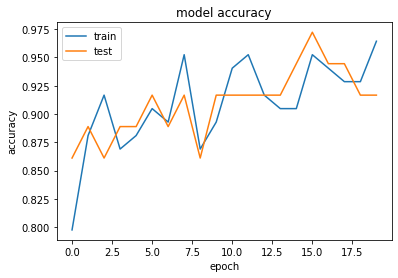

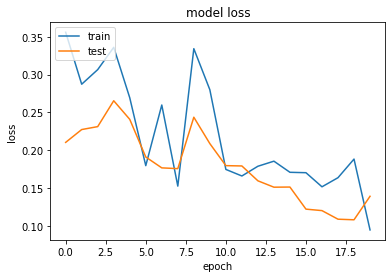

In [14]:
import matplotlib.pyplot as plt
print(history.history.keys())
# summarize history for accuracy
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

# **-------------------------------  END OF OBJECTIVE 2  ---------------------------------------**